In [1]:
%load_ext autoreload
%autoreload 2

import pickle
from figure_manager import FigureManager
from plots import *
import DynamicTimeAllocationModel

path = 'output/'
fm = FigureManager(path, use_latex=False)

# c++ settings
do_compile = False
load_par = True
threads = 64

do_reinstall_nlopt = False # If problems with NLOPT during re-compilation of c++ files, then try re-installing NLOPT by swithcing this to True and delete the folder "nlopt-2.4.2-dll64" in the cppfuncs folder before running this notebook.
if do_reinstall_nlopt:
    from EconModel import cpptools
    cpptools.setup_nlopt(folder='cppfuncs/', do_print=False,download=False,unzip=True)

# Solve and simulate from alternative models

Benchmark model settings

In [2]:
filename = 'calibrated_par'
with open(f"par_files/{filename}.pkl", "rb") as f:
    settings = pickle.load(f)
    settings['num_power'] = 13

In [3]:
show_iEGM = True
show_VFI = True
show_numEGM = True
show_iEGMinv = True

In [4]:
ever_compiled = False
if show_iEGM:
    settings_iEGM = settings.copy()
    settings_iEGM['do_egm'] = True
    settings_iEGM['interp_method'] = 'linear'
    settings_iEGM['interp_inverse'] = False
    
    compile_now = do_compile and not ever_compiled
    ever_compiled = ever_compiled or compile_now
    
    model_iEGM = DynamicTimeAllocationModel.HouseholdModelClass(par=settings_iEGM)
    model_iEGM.link_to_cpp(force_compile=compile_now)

    %time model_iEGM.solve()
    %time model_iEGM.simulate()
    
    model_iEGM.cpp.delink()

CPU times: total: 1h 54min 6s
Wall time: 2min 32s


CPU times: total: 25.3 s
Wall time: 1.02 s


In [5]:
if show_VFI:
    settings_VFI = settings.copy()
    settings_VFI['do_egm'] = False
    settings_VFI['do_multistart'] = True
    
    compile_now = do_compile and not ever_compiled
    ever_compiled = ever_compiled or compile_now
    
    model_VFI = DynamicTimeAllocationModel.HouseholdModelClass(par=settings_VFI)
    model_VFI.link_to_cpp(force_compile=compile_now)
    
    %time model_VFI.solve()
    %time model_VFI.simulate()

    model_VFI.cpp.delink()

CPU times: total: 5d 14h 35min 48s
Wall time: 2h 31min 56s


CPU times: total: 23 s
Wall time: 1.02 s


In [6]:
if show_numEGM:
    settings_numEGM = settings.copy()
    settings_numEGM['do_egm'] = True
    settings_numEGM['interp_method'] = 'numerical'
    settings_numEGM['do_multistart'] = False
    
    compile_now = do_compile and not ever_compiled
    ever_compiled = ever_compiled or compile_now
    
    model_numEGM = DynamicTimeAllocationModel.HouseholdModelClass(par=settings_numEGM)
    model_numEGM.link_to_cpp(force_compile=compile_now)
    
    %time model_numEGM.solve()
    %time model_numEGM.simulate()
    
    model_numEGM.cpp.delink()

CPU times: total: 1d 7h 29min 28s
Wall time: 38min 10s


CPU times: total: 26.3 s
Wall time: 1.41 s


In [7]:
if show_iEGMinv:
    settings_iEGMinv = settings.copy()
    settings_iEGMinv['do_egm'] = True
    settings_iEGMinv['interp_method'] = 'linear'
    settings_iEGMinv['interp_inverse'] = True
    
    compile_now = do_compile and not ever_compiled
    ever_compiled = ever_compiled or compile_now
    
    model_iEGMinv = DynamicTimeAllocationModel.HouseholdModelClass(par=settings_iEGMinv)
    model_iEGMinv.link_to_cpp(force_compile=compile_now)
    
    %time model_iEGMinv.solve()
    %time model_iEGMinv.simulate()
 
    model_iEGMinv.cpp.delink()

CPU times: total: 1h 55min 4s
Wall time: 2min 53s


CPU times: total: 27.2 s
Wall time: 1.43 s


Setup plotters

In [8]:
# plot unique values of sol.lm_couple_to_couple using numpy
import numpy as np
unique_values = np.unique(model_iEGM.sol.lm_couple_to_couple)
print("Unique values of sol.lm_couple_to_couple:", unique_values)

if show_iEGM:    mp_iEGM = model_plotter(model_iEGM, model_name='iEGM', titles=['variable'], labels=['model', 'index'])
if show_VFI:     mp_VFI = model_plotter(model_VFI, model_name='VFI', titles=['variable'], labels=['model', 'index'])
if show_numEGM:  mp_numEGM = model_plotter(model_numEGM, model_name='numEGM', titles=['variable'], labels=['model', 'index'])
if show_iEGMinv: mp_iEGMinv = model_plotter(model_iEGMinv, model_name='iEGMinv', titles=['variable'], labels=['model', 'index'])

save_figures = False
grid = 'grid_A'
idx = {'t': 0, 'il':0, 'type': 1, 'iK': 3, 'iP': 5, 'iL': 3, 'iA': 10, 'iA_pd': 10, 'iu': 10}
t, type, iK, iP, iL, iA = idx['t'], idx['type'], idx['iK'], idx['iP'], idx['iL'], idx['iA']

Unique values of sol.lm_couple_to_couple: [0.         0.17857143 0.35714286]


## Singles solution

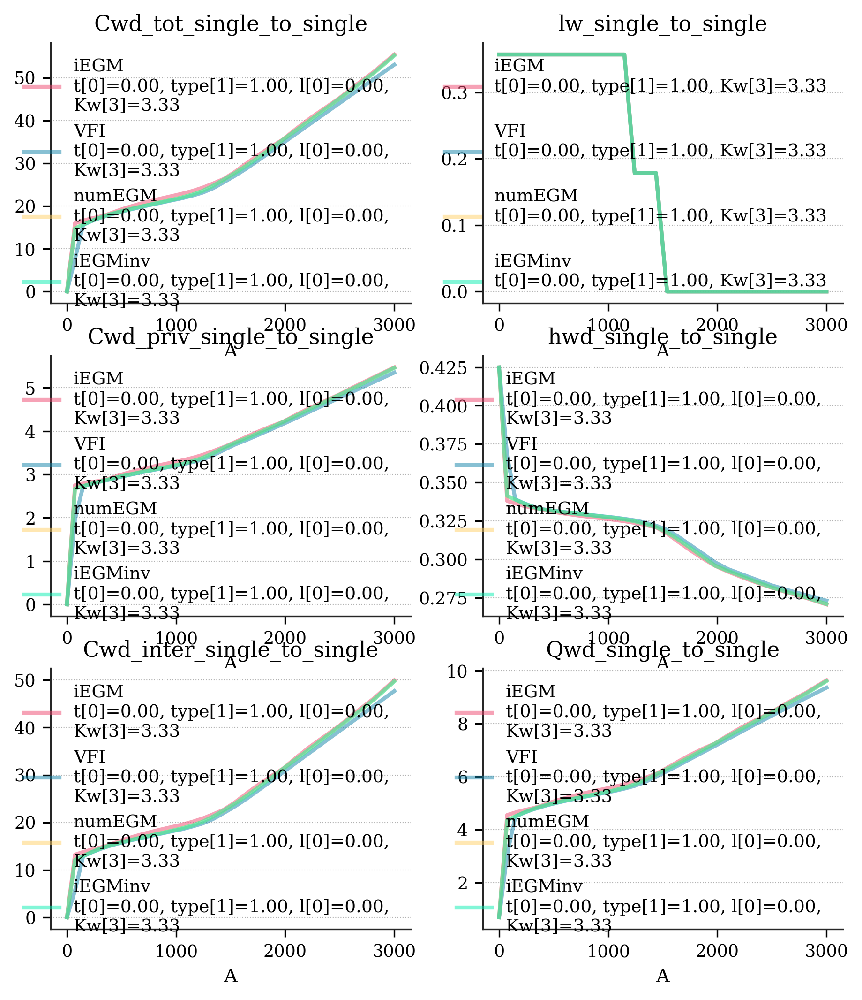

In [9]:
fig, ax = fm.create_figure(3,2,6)
if show_iEGM:    mp_iEGM.plot_female_single_choices(ax, grid=grid, index=idx, alpha=0.5)
if show_VFI:     mp_VFI.plot_female_single_choices(ax, grid=grid, index=idx, alpha=0.5)
if show_numEGM:  mp_numEGM.plot_female_single_choices(ax, grid=grid, index=idx, alpha=0.5)
if show_iEGMinv: mp_iEGMinv.plot_female_single_choices(ax, grid=grid, index=idx, alpha=0.5)
if save_figures: fm.save_figure(filename="female_single_choices")

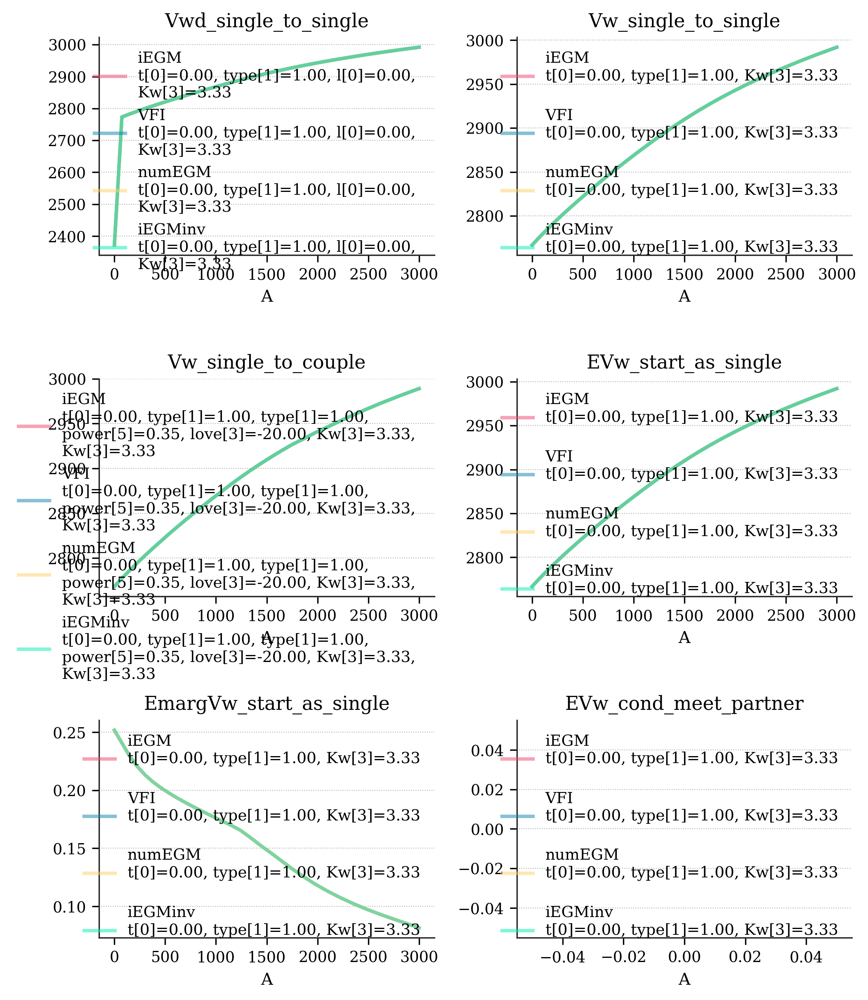

In [10]:
fig, ax = fm.create_figure(3,2,6)
if show_iEGM:    mp_iEGM.plot_female_single_values(ax, grid=grid, index=idx, alpha=0.5)
if show_VFI:     mp_VFI.plot_female_single_values(ax, grid=grid, index=idx, alpha=0.5)
if show_numEGM:  mp_numEGM.plot_female_single_values(ax, grid=grid, index=idx, alpha=0.5)
if show_iEGMinv: mp_iEGMinv.plot_female_single_values(ax, grid=grid, index=idx, alpha=0.5)
if save_figures: fm.save_figure(filename="female_single_values")
else: fig.tight_layout()

EGM stuff

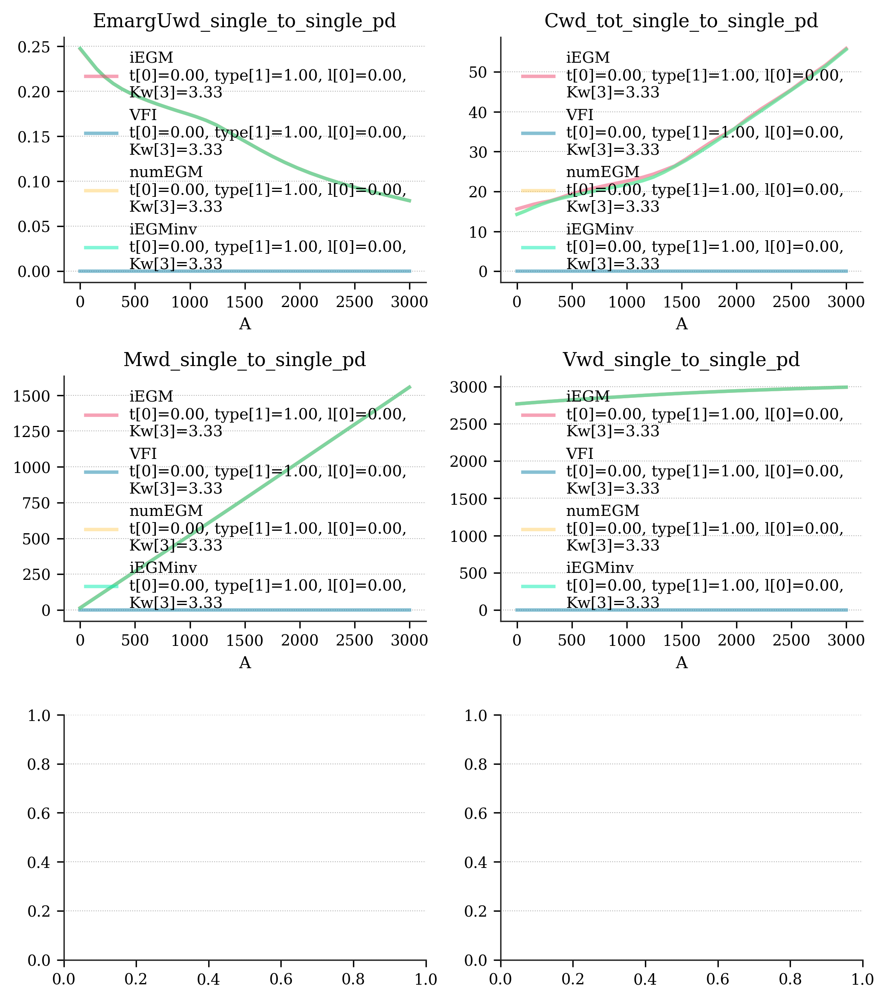

In [11]:
fig, ax = fm.create_figure(3,2,6)
if show_iEGM:    mp_iEGM.plot_female_single_pd(ax, grid=grid, index=idx, alpha=0.5)
if show_VFI:     mp_VFI.plot_female_single_pd(ax, grid=grid, index=idx, alpha=0.5)
if show_numEGM:  mp_numEGM.plot_female_single_pd(ax, grid=grid, index=idx, alpha=0.5)
if show_iEGMinv: mp_iEGMinv.plot_female_single_pd(ax, grid=grid, index=idx, alpha=0.5)
if save_figures: fm.save_figure(filename="female_single_pd")
else: fig.tight_layout()
# for ax in fig.axes:
#     ax.set_ylim(-0.1, 200.2)
# grid = 'grid_A'

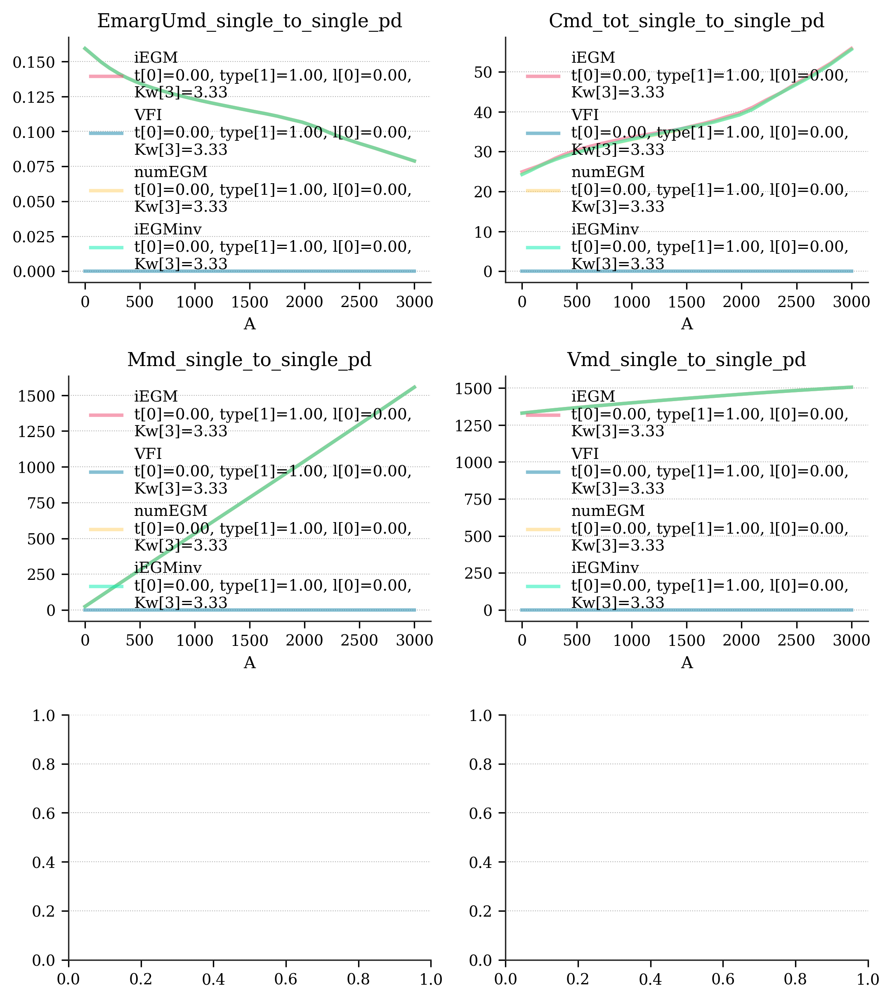

In [12]:
fig, ax = fm.create_figure(3,2,6)
if show_iEGM:    mp_iEGM.plot_male_single_pd(ax, grid=grid, index=idx, alpha=0.5)
if show_VFI:     mp_VFI.plot_male_single_pd(ax, grid=grid, index=idx, alpha=0.5)
if show_numEGM:  mp_numEGM.plot_male_single_pd(ax, grid=grid, index=idx, alpha=0.5)
if show_iEGMinv: mp_iEGMinv.plot_male_single_pd(ax, grid=grid, index=idx, alpha=0.5)
if save_figures: fm.save_figure(filename="male_single_pd")
else: fig.tight_layout()
# for ax in fig.axes:
#     ax.set_ylim(-0.1, 200.2)
# grid = 'grid_A'

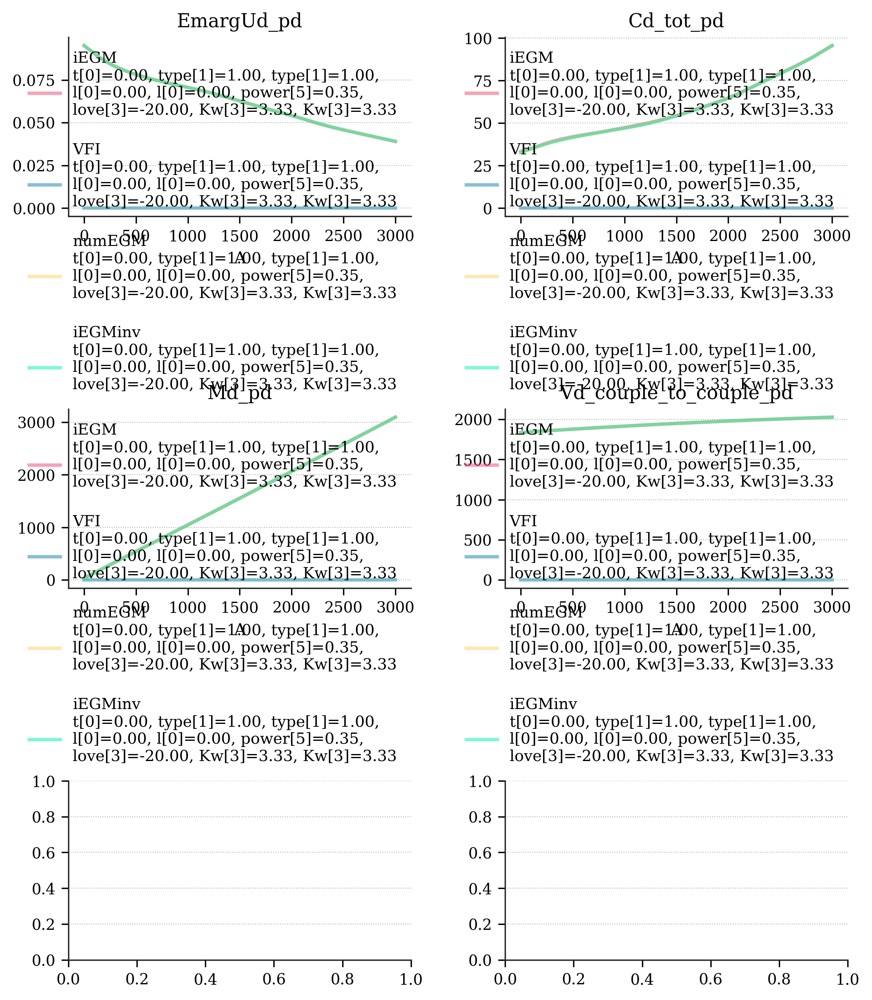

In [13]:
fig, ax = fm.create_figure(3,2,6)
if show_iEGM:    mp_iEGM.plot_couple_pd(ax, grid=grid, index=idx, alpha=0.5)
if show_VFI:     mp_VFI.plot_couple_pd(ax, grid=grid, index=idx, alpha=0.5)
if show_numEGM:  mp_numEGM.plot_couple_pd(ax, grid=grid, index=idx, alpha=0.5)
if show_iEGMinv: mp_iEGMinv.plot_couple_pd(ax, grid=grid, index=idx, alpha=0.5)
if save_figures: fm.save_figure(filename="female_couple_pd")
else: fig.tight_layout()
# for ax in fig.axes:
#     ax.set_ylim(-0.1, 200.2)
# grid = 'grid_A'

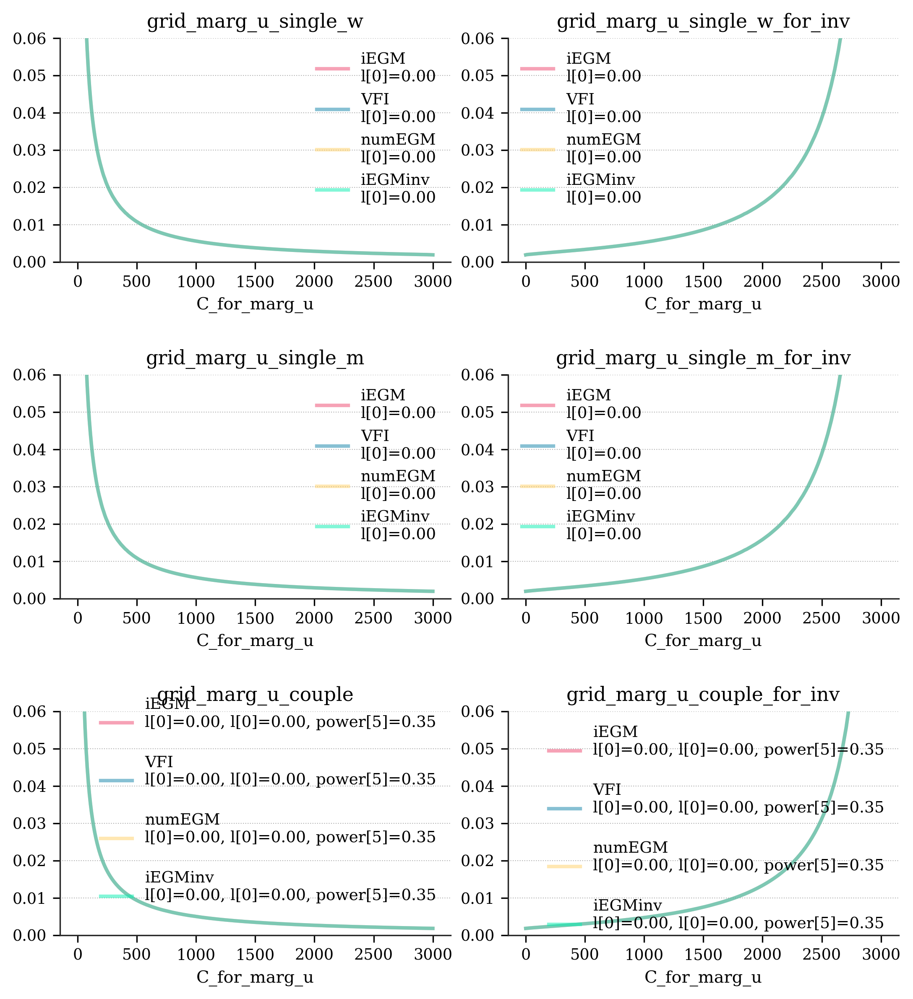

In [14]:
grid = 'grid_C_for_marg_u'
fig, ax = fm.create_figure(3,2,6)
if show_iEGM:    mp_iEGM.plot_iegm_grids(ax, grid=grid, index=idx, alpha=0.5)
if show_VFI:     mp_VFI.plot_iegm_grids(ax, grid=grid, index=idx, alpha=0.5)
if show_numEGM:  mp_numEGM.plot_iegm_grids(ax, grid=grid, index=idx, alpha=0.5)
if show_iEGMinv: mp_iEGMinv.plot_iegm_grids(ax, grid=grid, index=idx, alpha=0.5)
if save_figures: fm.save_figure(filename="female_couple_pd")
else: fig.tight_layout()
for ax in fig.axes:
    ax.set_ylim(0, 0.06)
grid = 'grid_A'

## Couples solution

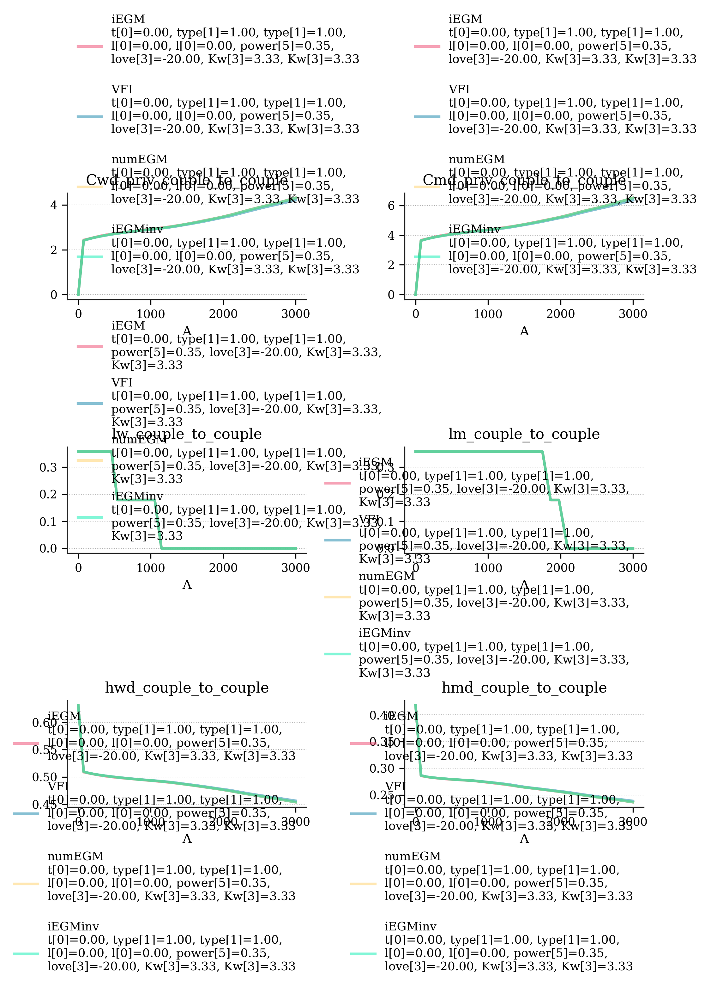

In [15]:
fig, ax = fm.create_figure(3,2,6)
if show_iEGM:    mp_iEGM.plot_gender_couple_choices(ax, grid=grid, index=idx, alpha=0.5)
if show_VFI:     mp_VFI.plot_gender_couple_choices(ax, grid=grid, index=idx, alpha=0.5)
if show_numEGM:  mp_numEGM.plot_gender_couple_choices(ax, grid=grid, index=idx, alpha=0.5)
if show_iEGMinv: mp_iEGMinv.plot_gender_couple_choices(ax, grid=grid, index=idx, alpha=0.5)
if save_figures: fm.save_figure(filename="gender_couple_choices")
else: fig.tight_layout()

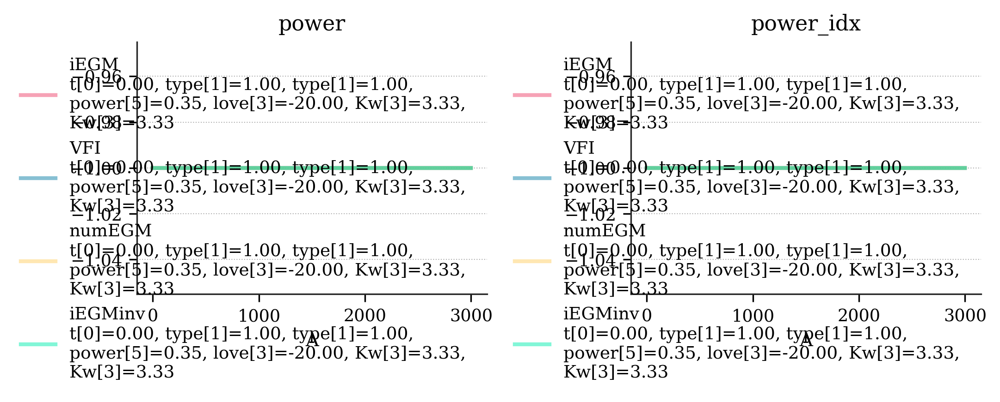

In [16]:
# model_iEGM.sol.power.shape #[idx['t'], idx['iP'], idx['iL'], :]
fig, ax = fm.create_figure(1,2,2)
if show_iEGM:    mp_iEGM.plot_power(ax, grid=grid, index=idx, alpha=0.5)
if show_VFI:     mp_VFI.plot_power(ax, grid=grid, index=idx, alpha=0.5)
if show_numEGM:  mp_numEGM.plot_power(ax, grid=grid, index=idx, alpha=0.5)
if show_iEGMinv: mp_iEGMinv.plot_power(ax, grid=grid, index=idx, alpha=0.5)
if save_figures: fm.save_figure(filename="power")
else: fig.tight_layout()

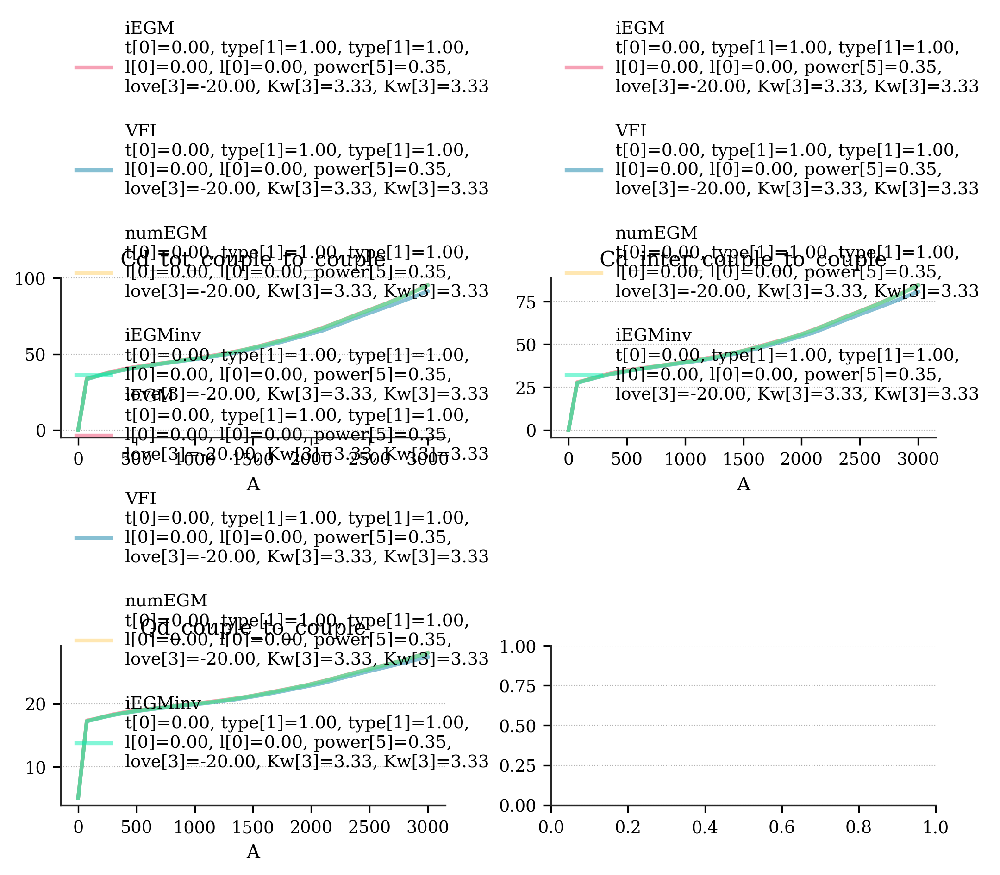

In [17]:
fig, ax = fm.create_figure(2,2,4)
if show_iEGM:    mp_iEGM.plot_total_couple_choices(ax, grid=grid, index=idx, alpha=0.5)
if show_VFI:     mp_VFI.plot_total_couple_choices(ax, grid=grid, index=idx, alpha=0.5)
if show_numEGM:  mp_numEGM.plot_total_couple_choices(ax, grid=grid, index=idx, alpha=0.5)
if show_iEGMinv: mp_iEGMinv.plot_total_couple_choices(ax, grid=grid, index=idx, alpha=0.5)
if save_figures: fm.save_figure(filename="total_couple_choices")
else: fig.tight_layout()


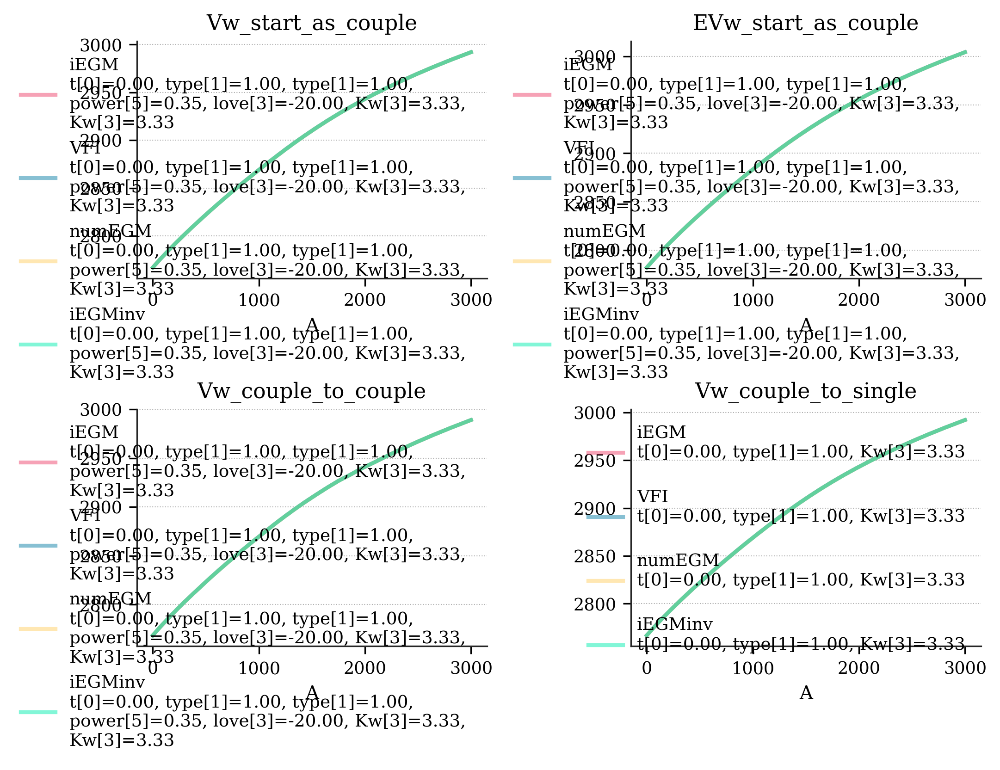

In [18]:
fig, ax = fm.create_figure(2,2,4)
if show_iEGM:    mp_iEGM.plot_female_couple_values(ax, grid=grid, index=idx, alpha=0.5)
if show_VFI:     mp_VFI.plot_female_couple_values(ax, grid=grid, index=idx, alpha=0.5)
if show_numEGM:  mp_numEGM.plot_female_couple_values(ax, grid=grid, index=idx, alpha=0.5)
if show_iEGMinv: mp_iEGMinv.plot_female_couple_values(ax, grid=grid, index=idx, alpha=0.5)
if save_figures: fm.save_figure(filename="female_couple_values")
else: fig.tight_layout()


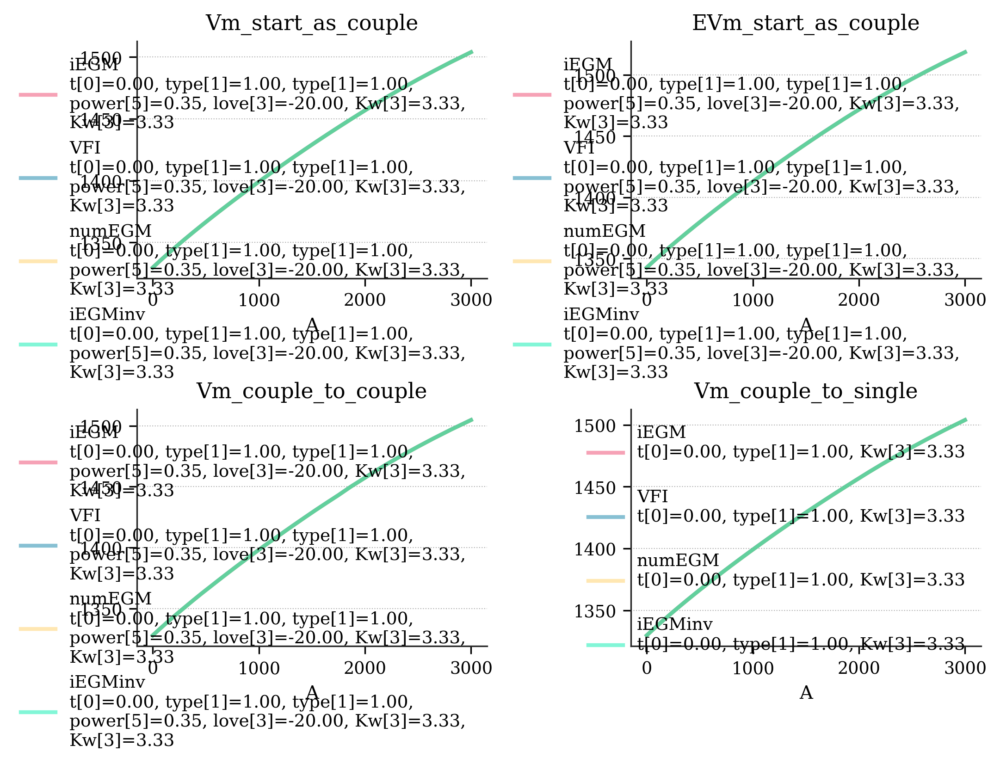

In [19]:
fig, ax = fm.create_figure(2,2,4)
if show_iEGM:    mp_iEGM.plot_male_couple_values(ax, grid=grid, index=idx, alpha=0.5)
if show_VFI:     mp_VFI.plot_male_couple_values(ax, grid=grid, index=idx, alpha=0.5)
if show_numEGM:  mp_numEGM.plot_male_couple_values(ax, grid=grid, index=idx, alpha=0.5)
if show_iEGMinv: mp_iEGMinv.plot_male_couple_values(ax, grid=grid, index=idx, alpha=0.5)
if save_figures: fm.save_figure(filename="male_couple_values")
else: fig.tight_layout()


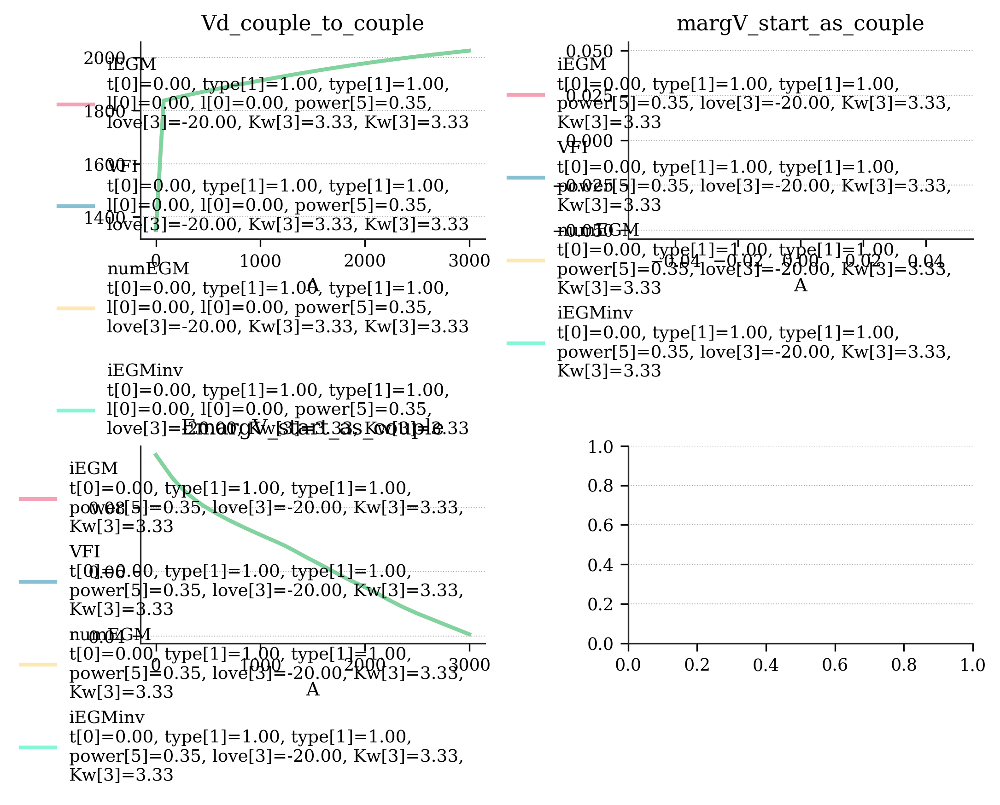

In [20]:
fig, ax = fm.create_figure(2,2,4)
if show_iEGM:    mp_iEGM.plot_total_couple_values(ax, grid=grid, index=idx, alpha=0.5)
if show_VFI:     mp_VFI.plot_total_couple_values(ax, grid=grid, index=idx, alpha=0.5)
if show_numEGM:  mp_numEGM.plot_total_couple_values(ax, grid=grid, index=idx, alpha=0.5)
if show_iEGMinv: mp_iEGMinv.plot_total_couple_values(ax, grid=grid, index=idx, alpha=0.5)
if save_figures: fm.save_figure(filename="total_couple_values")
else: fig.tight_layout()


## Simulation

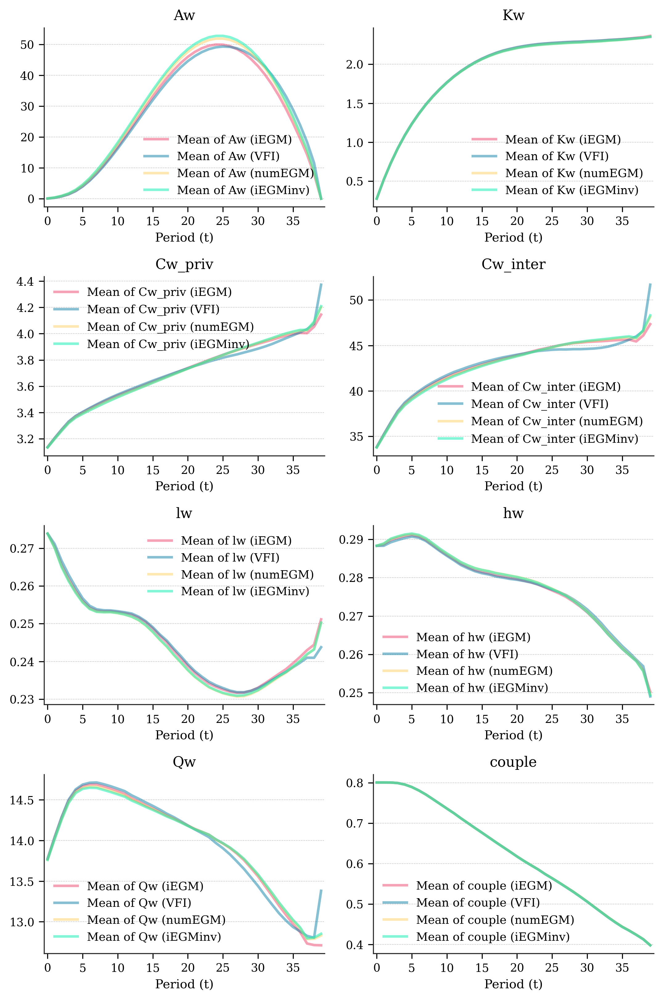

In [21]:
fig, ax = fm.create_figure(4,2,8)
if show_iEGM:    mp_iEGM.plot_sim_female(ax, alpha=0.5)
if show_VFI:     mp_VFI.plot_sim_female(ax, alpha=0.5)
if show_numEGM:  mp_numEGM.plot_sim_female(ax, alpha=0.5)
if show_iEGMinv: mp_iEGMinv.plot_sim_female(ax, alpha=0.5)
if save_figures: fm.save_figure(filename="sim_female_all")
else: fig.tight_layout()

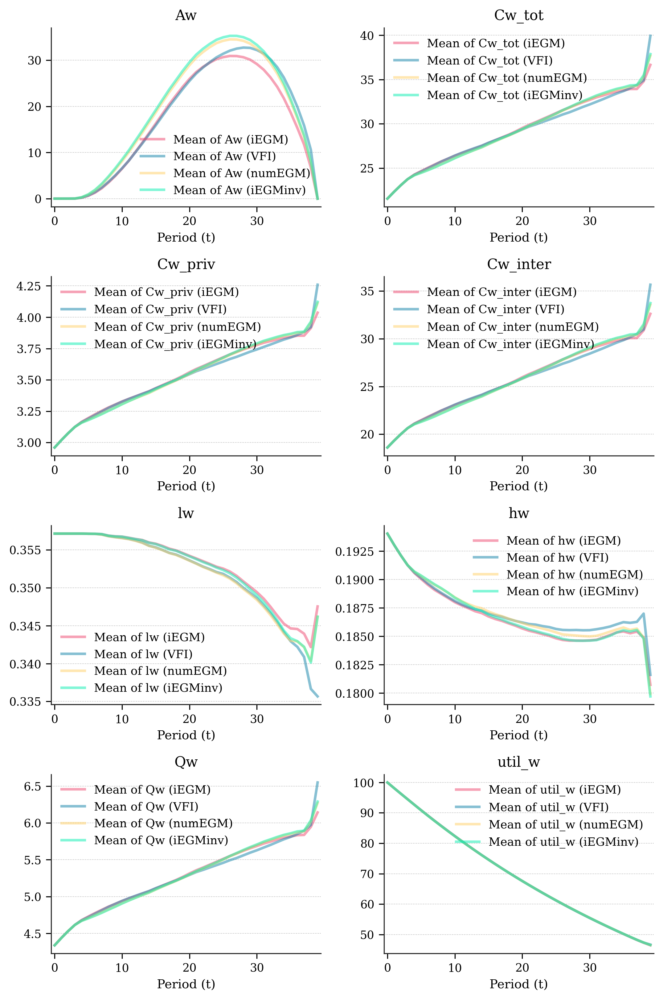

In [22]:
fig, ax = fm.create_figure(4,2,8)
if show_iEGM:    mp_iEGM.plot_sim_female_single(ax, alpha=0.5)
if show_VFI:     mp_VFI.plot_sim_female_single(ax, alpha=0.5)
if show_numEGM:  mp_numEGM.plot_sim_female_single(ax, alpha=0.5)
if show_iEGMinv: mp_iEGMinv.plot_sim_female_single(ax, alpha=0.5)
if save_figures: fm.save_figure(filename="sim_female_single")
else: fig.tight_layout()

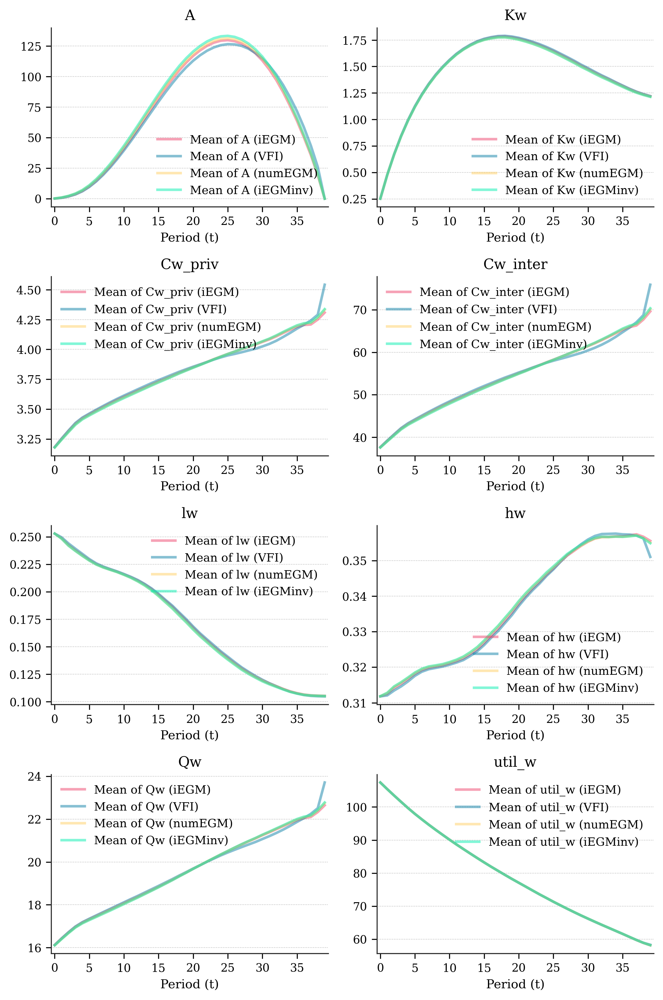

In [23]:
fig, ax = fm.create_figure(4,2,8)
if show_iEGM:    mp_iEGM.plot_sim_female_couple(ax, alpha=0.5)
if show_VFI:     mp_VFI.plot_sim_female_couple(ax, alpha=0.5)
if show_numEGM:  mp_numEGM.plot_sim_female_couple(ax, alpha=0.5)
if show_iEGMinv: mp_iEGMinv.plot_sim_female_couple(ax, alpha=0.5)
if save_figures: fm.save_figure(filename="sim_female_couple")
else: fig.tight_layout()

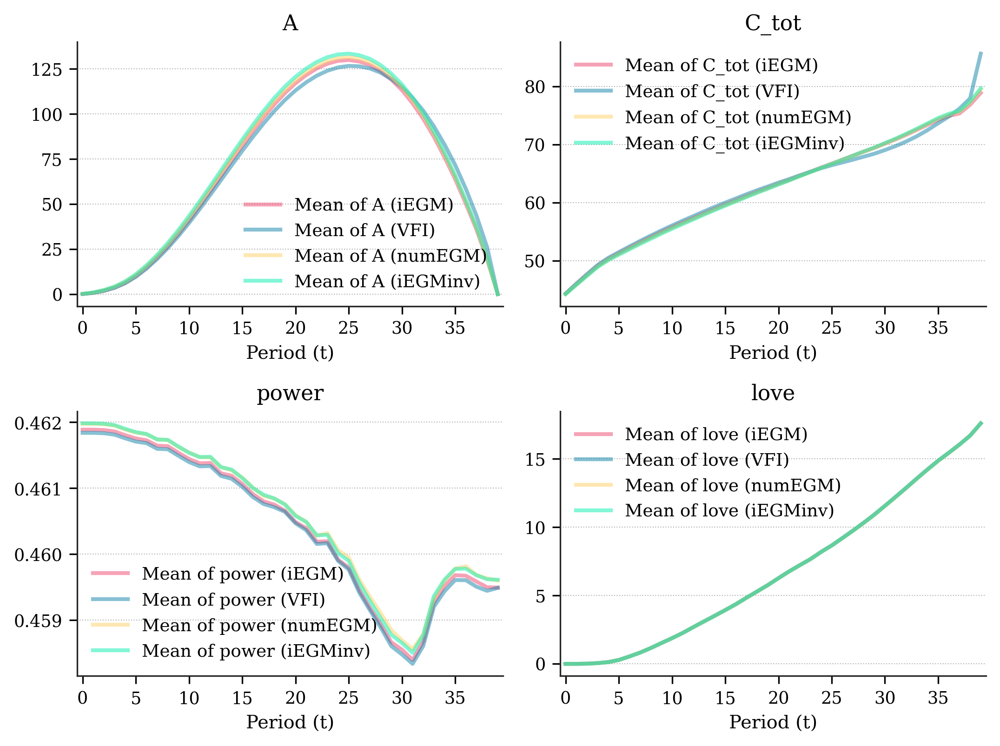

In [24]:
fig, ax = fm.create_figure(2,2,4)
if show_iEGM:    mp_iEGM.plot_sim_couple(ax, alpha=0.5)
if show_VFI:     mp_VFI.plot_sim_couple(ax, alpha=0.5)
if show_numEGM:  mp_numEGM.plot_sim_couple(ax, alpha=0.5)
if show_iEGMinv: mp_iEGMinv.plot_sim_couple(ax, alpha=0.5)
if save_figures: fm.save_figure(filename="sim_couple")
else: fig.tight_layout()

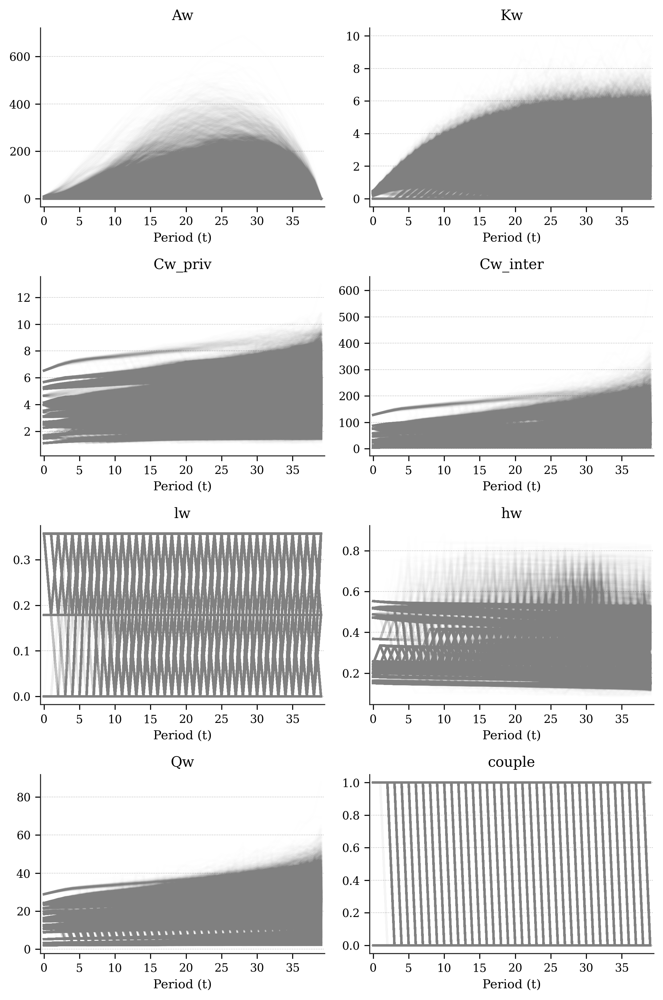

In [25]:
fig, ax = fm.create_figure(4,2,8)
mp_iEGMinv.plot_sim_female(ax, agg_fct=None)
if save_figures: fm.save_figure(filename="sim_test")
else: fig.tight_layout()

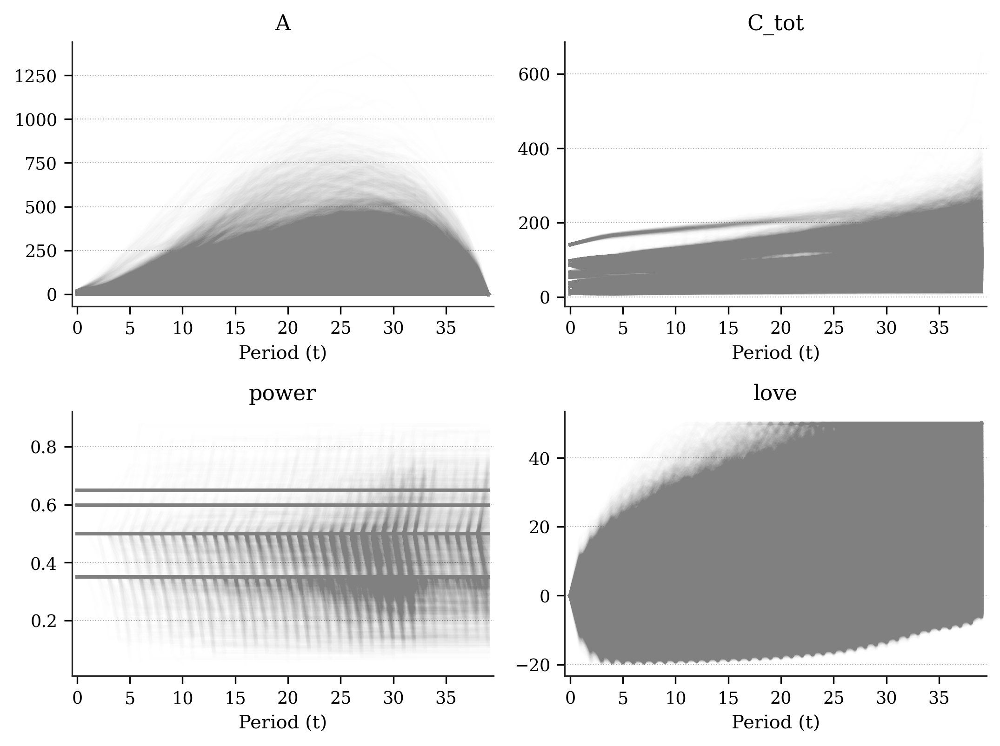

In [26]:
fig, ax = fm.create_figure(2,2,4)
mp_iEGMinv.plot_sim_couple(ax, agg_fct=None ,alpha=0.5)
if save_figures: fm.save_figure(filename="sim_test")
else: fig.tight_layout()